In [1]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [34]:
# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN11'] 
dates_per_mouse = {'NN11': ['210627']}

for mouse in mice:
    dates = dates_per_mouse[mouse]  # Get the list of dates for the current mouse
    days = len(dates)  # Correct number of days for this mouse
    
    for day_idx, date in enumerate(dates):
        print(mouse, date)
        
        # Create folders to save files
        paths = preprocess.create_folders(mouse, date)
        print('folders created')
        
        # Import data for mouse and date as dict
        session_data = preprocess.load_data(paths)
        print('data loaded')
        
        # Process and plot behavior
        behavior = preprocess.process_behavior(session_data, paths)
        print('behavior done')
        
        # Save masks so can run in Matlab to process other planes
        # preprocess.cell_masks(paths, 0)
        print('masks saved')
        
        # Grab activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        print('activity processed')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        print('activity normalized')
        
        # Gaussian filter activity
        norm_moving_deconvolved_filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        print('activity filtered')
        
        # Make trial-averaged traces and baseline subtract
        mean_cs_1_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs_2_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        print('traces done')
        
        # Get significant cells
        [cs_1_poscells, cs_1_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        [cs_2_poscells, cs_2_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        [both_poscells, both_sigcells] = preprocess.combine_sig(cs_1_poscells, cs_1_negcells, cs_2_poscells, cs_2_negcells)
        print('sig cells done')
        
        # Get index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs_1_responses_df, mean_cs_2_responses_df, cs_1_poscells, cs_2_poscells, both_poscells, both_sigcells, paths, 1)
        print('idx done')
        
        # Get prior for synchronous cue activity
        prior = classify.prior(norm_moving_deconvolved_filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        print('prior done')
        
        # Logistic regression
        #y_pred, feature_importance_all = classify.log_regression_no_splits(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)
        y_pred_log, feature_importance_all = classify.log_regression_splits(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)

        print('logistic regression done')
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        print('classified done')
    


NN11 210627
folders created
data loaded
behavior done
masks saved
activity processed
activity normalized
activity filtered
traces done
sig cells done
idx done
prior done
logistic regression done
classified done


In [35]:
activity = norm_deconvolved.to_numpy()
activity = activity[idx['both'].index]
print(activity.shape)

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
topn = 0.05

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

# Normalize the mean activities for each trial.
mean_activity_cs_1 = mean_activity_cs_1 / np.mean(mean_activity_cs_any, axis=0)
mean_activity_cs_2 = mean_activity_cs_2 / np.mean(mean_activity_cs_any, axis=0)

mean_activity_cs_1 = np.stack(mean_activity_cs_1, axis=0)
mean_activity_cs_2 = np.stack(mean_activity_cs_2, axis=0)

# Calculate the mean of the first and last three mean activities for cs_1 and cs_2.
n_centroids = 3
mean_activity_cs_1_mean = [np.mean(mean_activity_cs_1[0:n_centroids], axis=0), np.mean(mean_activity_cs_1[len(mean_activity_cs_1) - n_centroids:len(mean_activity_cs_1)], axis=0)]
mean_activity_cs_2_mean = [np.mean(mean_activity_cs_2[0:n_centroids], axis=0), np.mean(mean_activity_cs_2[len(mean_activity_cs_2) - n_centroids:len(mean_activity_cs_2)], axis=0)]

# Calculate the difference vectors between the early and late mean activities for cs_1 and cs_2.
mean_activity_cs_1_vec = mean_activity_cs_1_mean[1] - mean_activity_cs_1_mean[0]
mean_activity_cs_2_vec = mean_activity_cs_2_mean[1] - mean_activity_cs_2_mean[0]

late_trails_1 = mean_activity_cs_1_mean[1]
top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
mean_activity_cstopn_1 = mean_activity_cs_1[:, top_n_percent_indices_1]
mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

late_trails_2 = mean_activity_cs_2_mean[1]
top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
mean_activity_cstopn_2 = mean_activity_cs_2[:, top_n_percent_indices_2]
mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_cs_1 = np.zeros(len(mean_activity_cs_1))
sim_cs_2 = np.zeros(len(mean_activity_cs_2))

# Normalize the mean activities for each trial using the difference vectors.
for i in range(0, len(mean_activity_cs_1)):
    sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
    # sim_cs_1[i] = cos_sim(mean_activity_cs_1[i], mean_activity_cs_1_mean[1])
    # sim_cs_1[i] = np.dot(mean_activity_cs_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_cs_2)):
    sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)
    # sim_cs_2[i] = cos_sim(mean_activity_cs_2[i], mean_activity_cs_2_mean[1])
    # sim_cs_2[i] = np.dot(mean_activity_cs_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)


# Initialize lists to store mean activities and trial indices for reactivation events.
mean_activity_r_1 = []
mean_activity_r_2 = []
mean_activity_r_any = []
trial_r_1 = []
trial_r_2 = []

# Copy reactivation predictions for cs_1 and cs_2.
reactivation_cs_1 = y_pred[:, 0].copy()
reactivation_cs_2 = y_pred[:, 1].copy()

# Set a threshold for reactivation probability.
p_threshold = .75

# Initialize variables for reactivation event detection.
cs_1_peak = 0
cs_2_peak = 0
i = 0
next_r = 0

# Loop through reactivation predictions to detect reactivation events.
while i < len(reactivation_cs_1) - 1:
    # Check if there is a reactivation event.
    if reactivation_cs_1[i] > 0 or reactivation_cs_2[i] > 0:
        if next_r == 0:
            r_start = i
            next_r = 1
        # Update peak reactivation values.
        if reactivation_cs_1[i] > cs_1_peak:
            cs_1_peak = reactivation_cs_1[i]
        if reactivation_cs_2[i] > cs_2_peak:
            cs_2_peak = reactivation_cs_2[i]
        #print(reactivation_cs_1[i + 1], reactivation_cs_2[i + 1])
        # Check if the reactivation event has ended.
        if reactivation_cs_1[i + 1] <= 0.001 and reactivation_cs_2[i + 1]<= 0.001:
            r_end = i + 1
            next_r = 0
            # Store mean activity and trial index for cs_1 reactivation events above the threshold.
            if cs_1_peak > p_threshold:
                for j in range(0, len(onsets_cs_1)):
                    if r_start < onsets_cs_1[j] and r_start > onsets_cs_1[j-1] and r_start < onsets_cs_1[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_1.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_1.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Store mean activity and trial index for cs_2 reactivation events above the threshold.
            if cs_2_peak > p_threshold:
                for j in range(0, len(onsets_cs_2)):
                    if r_start < onsets_cs_2[j] and r_start > onsets_cs_2[j-1] and r_start < onsets_cs_2[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_2.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_2.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Reset variables for the next reactivation event.
            i = r_end
            cs_1_peak = 0
            cs_2_peak = 0
    i += 1


# Normalize the reactivation mean activities.
mean_activity_r_1 = mean_activity_r_1 / np.mean(mean_activity_r_any, axis=0)
mean_activity_r_2 = mean_activity_r_2 / np.mean(mean_activity_r_any, axis=0)

mean_activity_r_1 = np.stack(mean_activity_r_1, axis=0)
mean_activity_r_2 = np.stack(mean_activity_r_2, axis=0)

print(len(trial_r_1), len(trial_r_2))

print(mean_activity_cs_1.shape)


(2790, 106665)
114 129
(65, 2790)


# raw traces per event

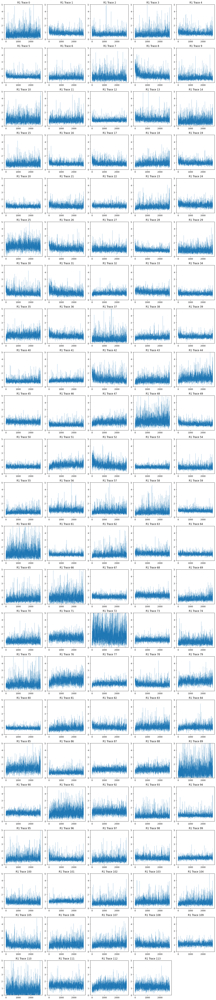

In [36]:
n_traces = mean_activity_r_1.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_r_1[i, :], lw=.25)
    axes[i].set_title(f" R1 Trace {i}")
    axes[i].set_ylim(0, 5)
for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


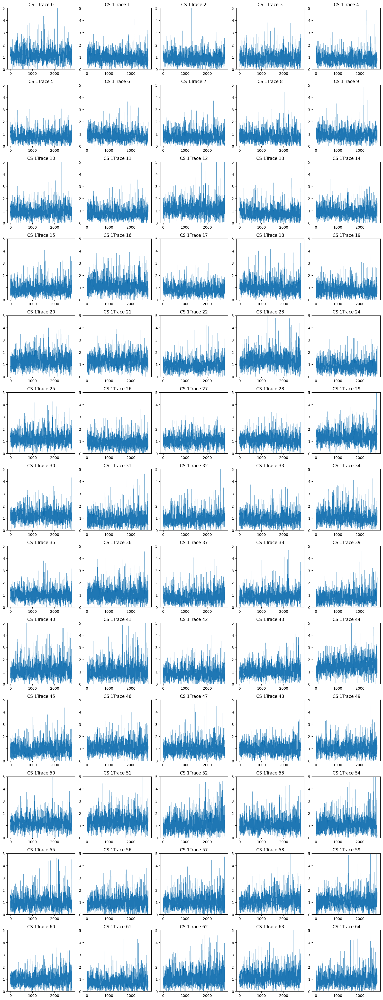

In [37]:
n_traces = mean_activity_cs_1.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_cs_1[i, :], lw=.25)
    axes[i].set_title(f"CS 1Trace {i}")
    axes[i].set_ylim(0, 5)
for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


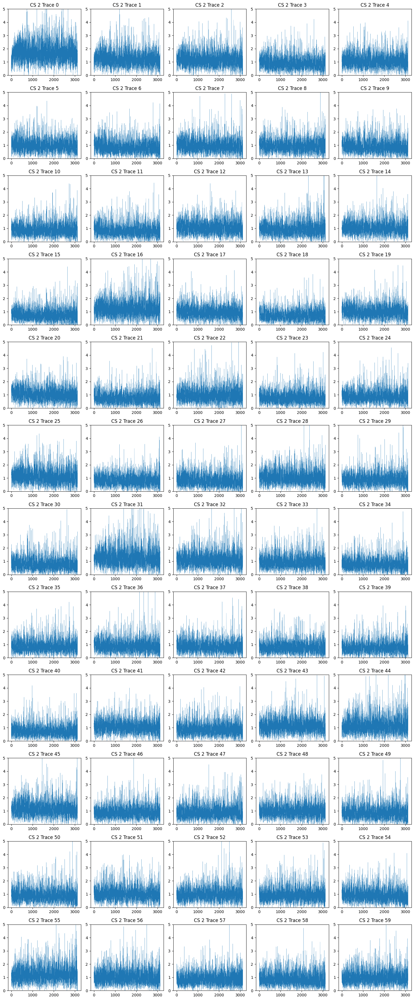

In [30]:
n_traces = mean_activity_cs_2.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_cs_2[i, :], lw=.25)
    axes[i].set_title(f"CS 2 Trace {i}")
    axes[i].set_ylim(0, 5)

for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


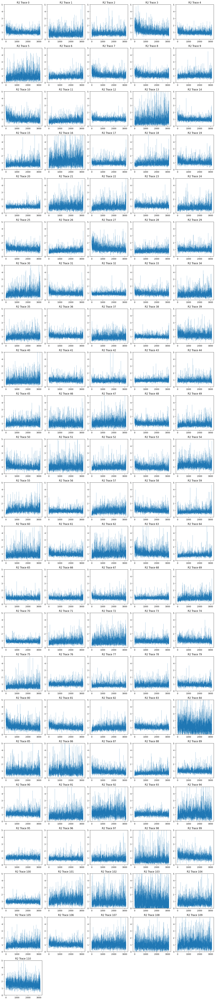

In [31]:
n_traces = mean_activity_r_2.shape[0]
cols = 5  # Number of plots per row
rows = math.ceil(n_traces / cols)


fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  

for i in range(n_traces):
    axes[i].plot(mean_activity_r_2[i, :], lw=.25)
    axes[i].set_title(f"R2 Trace {i}")
    axes[i].set_ylim(0, 5)

for j in range(n_traces, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


# in- or decrease pattern

Neurons +1 +1 [  0  60  25   2  83   8   0   6   1   7  67  24  19  10  17  20   4  70
   2   8  62  62  63  33  27  33  27  26   7  59   5  16  15  14   0 111
  28  14  23  60  24  38  38   1 107  33  18  41   6  22   1  34  11  21
  59  10   9  16  46  35  47  40  34  31  27  26  10  26   2  18   5   4
  10  42   0  71   4  10   2  10   3   1  21   0   5   5   7  16   1  41
   0  25   6   9  23   8  44  20   9  22  52  18   1  18  26 127  67  30
  61  33  36 109  26 128  46  10  81  28   7 236 362   9   5  61  21  15
   1 195 166  12  21  27  94 211  41  34   4 500] Neurons 0 0 [2384 1595 1400 1536 1550 1560 1597 2311 2331 2179 1868 1581 1348 1520
 1480 1232 1206 1739 1656 1291  867  804  891 1154 1015  877 1231 1517
 1509 1462 1710 1641 1709 1372 1338 1455 1759 1571 1358 1219 1247 1255
 1335 1401 1325 1113  949 1460 2030 1783 1742 1461 1564 1321 1546 1507
 1516 1611 1561 1299 1079 1060 1187 1358 1475 1477 1202 1187 1427 2146
 2328 2203 2073 1231 1198 1368 1912 1781 1994 2199 2246 19

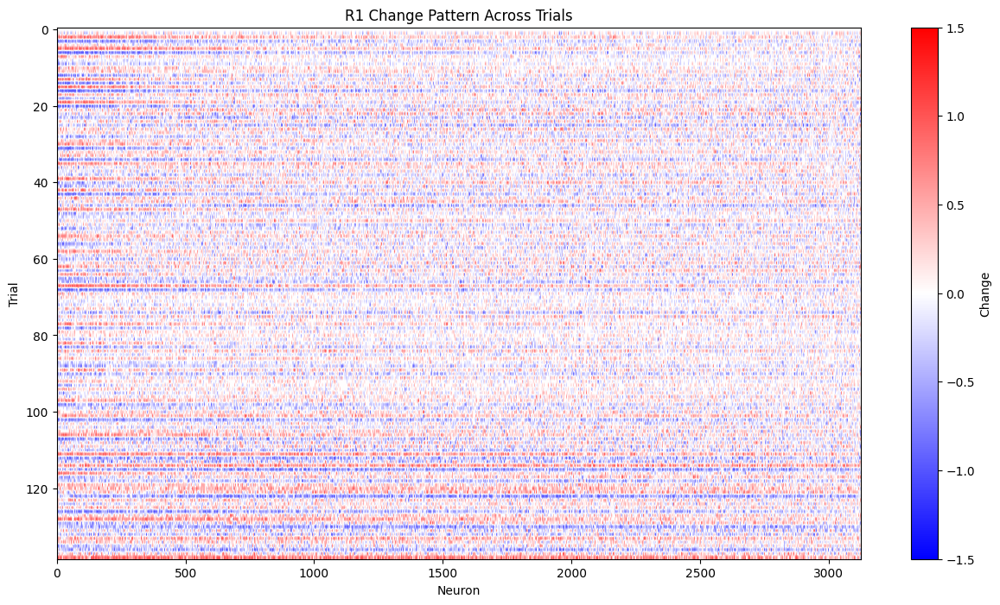

In [6]:
def compute_trial_changes(data):
    """
    Given a 2D array 'data' of shape (n_trials, n_neurons), this function:
    1. Computes the mean and standard deviation (across trials) for each neuron.
    2. Computes, for each trial (starting at trial 1), the difference from the previous trial.
    3. Marks neurons that increase more than one std with +1, 
       and those that decrease more than one std with -1.
       
    Returns:
        baseline: (n_neurons,) array of the mean activity per neuron.
        std: (n_neurons,) array of the standard deviation per neuron.
        change_marks: (n_trials, n_neurons) array with values -1, 0, or +1.
                      Trial 0 is set to all zeros (no previous trial for comparison).
    """
    n_trials, n_neurons = data.shape
    baseline = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    
    # Initialize change marks: first trial gets no change info.
    change_marks = np.zeros((n_trials, n_neurons))
    
    for i in range(1, n_trials):
        diff = data[i, :] - data[i-1, :]
        # Mark +1 if increase greater than std, -1 if decrease more than std, else 0.
        change_marks[i, :] = np.where(diff > std, 1, np.where(diff < -std, -1, 0))
    
    return baseline, std, change_marks

def count_consistent_changes_by_category(changes):
    """
    For each consecutive trial pair, count how many neurons maintain the same change.
    
    Parameters:
      changes: np.ndarray of shape (n_trials, n_neurons)
               Each entry should be +1 (increase), -1 (decrease), or 0 (no significant change).
    
    Returns:
      consistent_positive: np.ndarray of length (n_trials - 1) with counts of neurons that were +1 
                           in trial i-1 and remain +1 in trial i.
      consistent_zero: np.ndarray of length (n_trials - 1) with counts of neurons that were 0 
                       in trial i-1 and remain 0 in trial i.
      consistent_negative: np.ndarray of length (n_trials - 1) with counts of neurons that were -1 
                           in trial i-1 and remain -1 in trial i.
    """
    n_trials, n_neurons = changes.shape
    consistent_positive = []
    consistent_zero = []
    consistent_negative = []
    
    for i in range(1, n_trials):
        # Neurons that were +1 in trial i-1 and are also +1 in trial i.
        pos_count = np.sum((changes[i-1, :] == 1) & (changes[i, :] == 1))
        # Neurons that were 0 in trial i-1 and are also 0 in trial i.
        zero_count = np.sum((changes[i-1, :] == 0) & (changes[i, :] == 0))
        # Neurons that were -1 in trial i-1 and are also -1 in trial i.
        neg_count = np.sum((changes[i-1, :] == -1) & (changes[i, :] == -1))
        
        consistent_positive.append(pos_count)
        consistent_zero.append(zero_count)
        consistent_negative.append(neg_count)
    
    return (np.array(consistent_positive), 
            np.array(consistent_zero), 
            np.array(consistent_negative))

baseline, std, changes_r1 = compute_trial_changes(mean_activity_r_1)
pos_r1, zero_r1, neg_r1 = count_consistent_changes_by_category(changes_r1)

print("Neurons +1 +1", pos_r1, "Neurons 0 0", zero_r1, "Neurons -1 -1", neg_r1)

plt.figure(figsize=(15, 8))
plt.imshow(changes_r1, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('R1 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0   4 143  11  15   4 123  45  11  12   3   3  44   0  46  26  16  24
   9   5  20  23  29  31   4  18   6   5  14  74   4   7   4  21  15  51
  22   1 138  11   2  17   1   9   4  22  44  18  22  26  58  20  30  51
  66   0  11  12  15  35  11  88  38  17   2   9   6   5  13   0  26  21
   7  38   5   6  39   7  10  73  16  19  10 149   9  94  24  13  17  98
  18  22  60  76   1  26   2  22  48  29  18  56  71  40 123  86  85  29
  81 339] Neurons 0 0 [1893 1542 1258 1454 1162 1365 1221 1735 1828 1587 1560 1642 1237 1179
 1113  957  943 1151 1650 1796 1556 1445 1249 1317 1198 1299 1406 1463
 1382 1589 1493 1683 2065 1726 1373 1304 1377 1628 1519 1208 1010 1693
 2271 2417 2032 1529 1277 1228 1287 1391 1339 1330 1413 1163 1197 1407
 1569 1578 1501 1522 1672 1208 1180 1235 1682 2339 2351 2333 2146 2231
 1981 1552 1392 1569 1483 1195 1468 1748 1951 1532 1518 1445 1597  867
  703  723 1156 1408 1650 1670 1243  737  806  907 1225 1354 1888 1539
  863 1013 1184  993  547  64

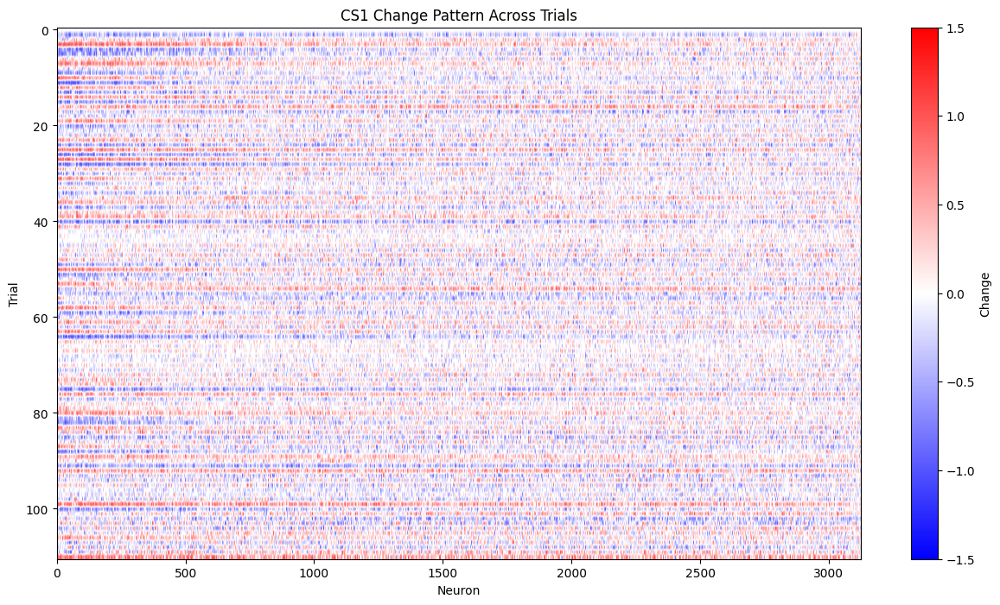

In [7]:
baseline, std, changes_r2 = compute_trial_changes(mean_activity_r_2)
pos_r2, zero_r2, neg_r2 = count_consistent_changes_by_category(changes_r2)

print("Neurons +1 +1", pos_r2, "Neurons 0 0", zero_r2, "Neurons -1 -1", neg_r2)

plt.figure(figsize=(15, 8))
plt.imshow(changes_r2, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('CS1 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0   6  26  27  20   7  54  31  10  11  17  14  16  33  19  39  15  20
  76   9  20  85  13  38  17  14  32  37  10   7  19  33 220  76  68  19
  23  19  54  17  22  20  10   6  51  44  12  17  36  23  30  64  23  28
  67  30  41  12  18  58  19  18  43  63  39  33  62] Neurons 0 0 [1352  862 1300 1176 1198 1221 1264 1211 1098 1275 1425 1526 1530 1273
 1271 1296 1326 1256 1181 1218 1235 1143 1195 1013  986 1112 1372 1319
 1308 1385 1500 1382  907  905 1004  953  959 1365 1215 1189 1076 1156
 1255 1529 1244 1163 1269 1428 1452 1484 1349 1312 1447 1317 1258 1202
 1160 1151 1196 1195 1196 1239 1374 1201 1182 1166 1130] Neurons -1 -1 [  0 148  63  23  22  65   8  11 107  38  26  37  13   7  14  17  31  31
  20  39  43   9  24  24  21 103  18  23  44  39  19  10  18  18  51  66
  84  16  20  30  17  20  68  36  14  13  93  26   7  42  16  12  39  20
  12  39  45  78  59  18  36  33  12  16  11  65  32]


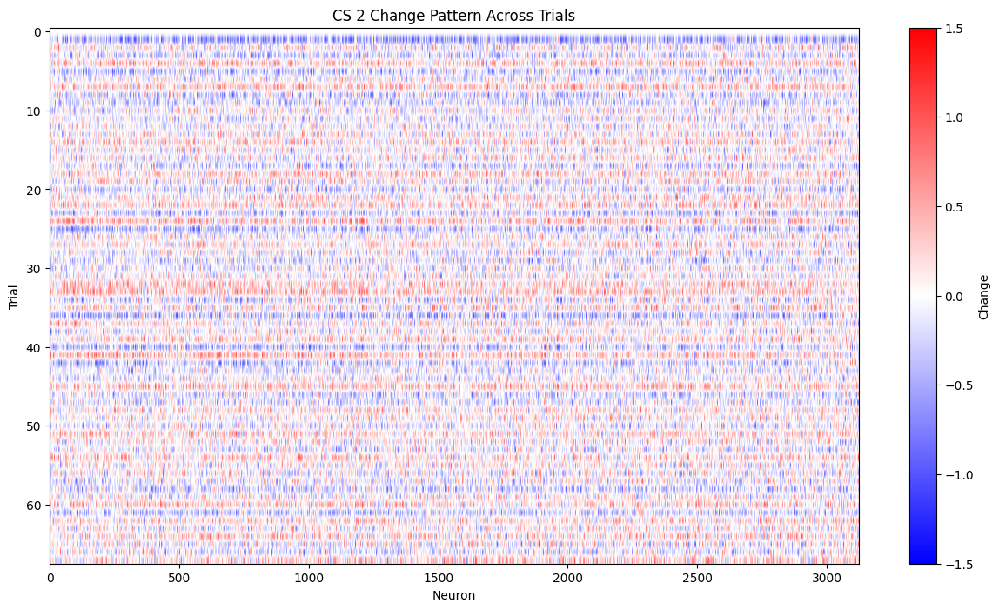

In [8]:
baseline, std, changes_cs1 = compute_trial_changes(mean_activity_cs_1)
pos_cs1, zero_cs1, neg_cs1 = count_consistent_changes_by_category(changes_cs1)

print("Neurons +1 +1", pos_cs1, "Neurons 0 0", zero_cs1, "Neurons -1 -1", neg_cs1)

    
plt.figure(figsize=(15, 8))
plt.imshow(changes_cs1, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('CS 2 Change Pattern Across Trials')
plt.show()




Neurons +1 +1 [  0   9   7  21  28   9  20  28  16  23  20  40  37  20  16  35  49   9
  24  93  11  14  22  19 103  16  13  59  55   3  93 101  17   8  17  57
  18  26  17  15  67  38  26  98  51  15  15  28  31  18  59  42  25  20
 107  40  26  13  50] Neurons 0 0 [1409  908 1238 1279 1413 1360 1417 1381 1359 1380 1443 1275 1224 1224
 1238  879  864  942 1162 1166 1183 1105 1201 1188 1065 1053 1086 1252
 1188 1238  860  804  956 1266 1448 1439 1392 1416 1532 1605 1163 1149
 1161 1018  992  930  988 1138 1176 1255 1237 1206 1221 1316  961  974
  981 1256 1247] Neurons -1 -1 [  0 176  83  30  18  60  28  10  29  27  30  15  22  45  52  23  12 185
  13  11  74  40  25  22  10  22  72  12  28  60  20   8 153 100  21  19
  22  41  25  23  11  18  23  17  30 131 100  21  48  49  24  20  40  49
  23  12 147  53  25]


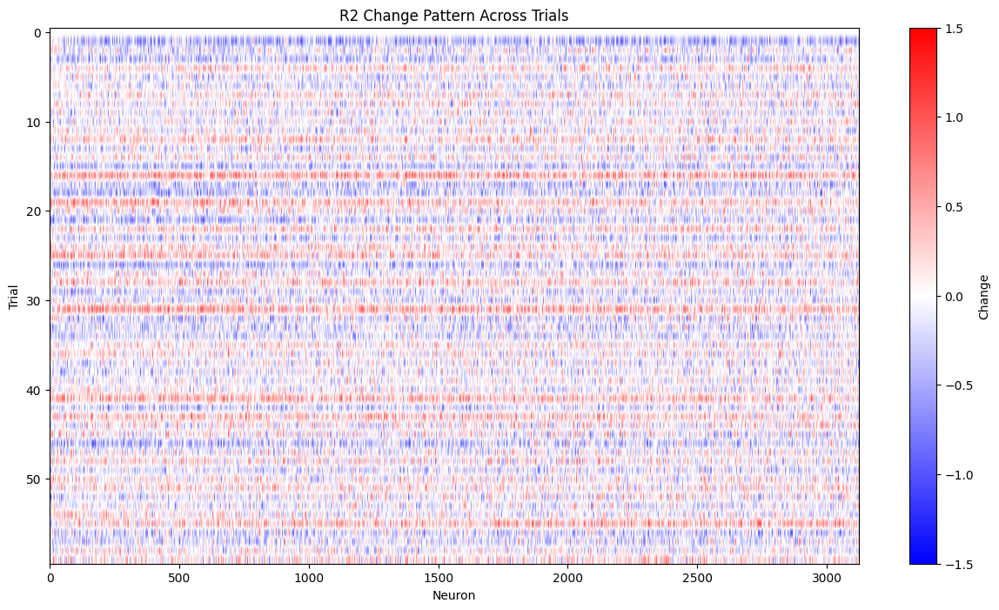

In [9]:
baseline, std, changes_cs2 = compute_trial_changes(mean_activity_cs_2)
pos_cs2, zero_cs2, neg_cs2 = count_consistent_changes_by_category(changes_cs2)

print("Neurons +1 +1", pos_cs2, "Neurons 0 0", zero_cs2, "Neurons -1 -1", neg_cs2)
    
plt.figure(figsize=(15, 8))
plt.imshow(changes_cs2, aspect='auto', cmap='bwr', vmin=-1.5, vmax=1.5)
plt.colorbar(label='Change')  # Shows the color scale for -1, 0, +1
plt.xlabel('Neuron')
plt.ylabel('Trial')
plt.title('R2 Change Pattern Across Trials')
plt.show()



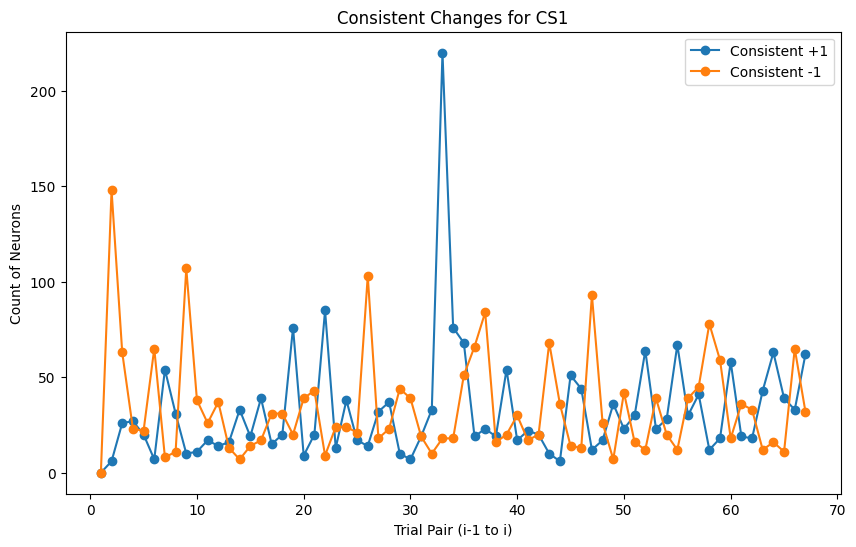

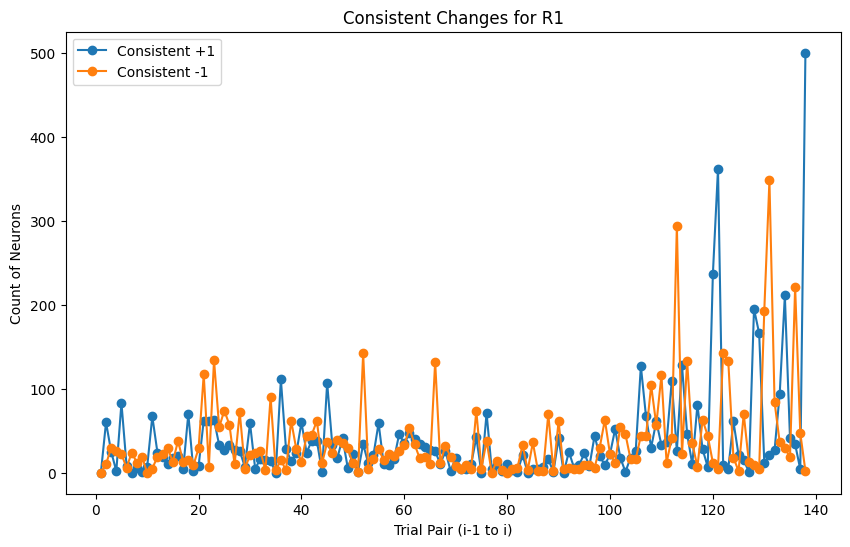

In [32]:
trial_pairs_cs1 = np.arange(1, changes_cs1.shape[0])
trial_pairs_r1 = np.arange(1, changes_r1.shape[0])


# Visualize the counts for CS condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_cs1, pos_cs1, marker='o', label='Consistent +1')
#plt.plot(trial_pairs_cs1, zero_cs1, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_cs1, neg_cs1, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for CS1')
plt.legend()
plt.show()

# Visualize the counts for R condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_r1, pos_r1, marker='o', label='Consistent +1')
#plt.plot(trial_pairs_r1, zero_r1, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_r1, neg_r1, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for R1')
plt.legend()
plt.show()

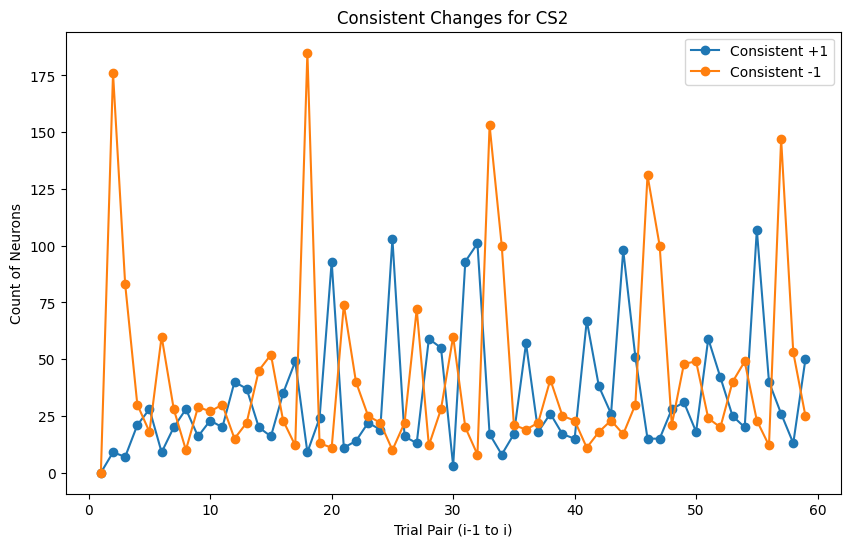

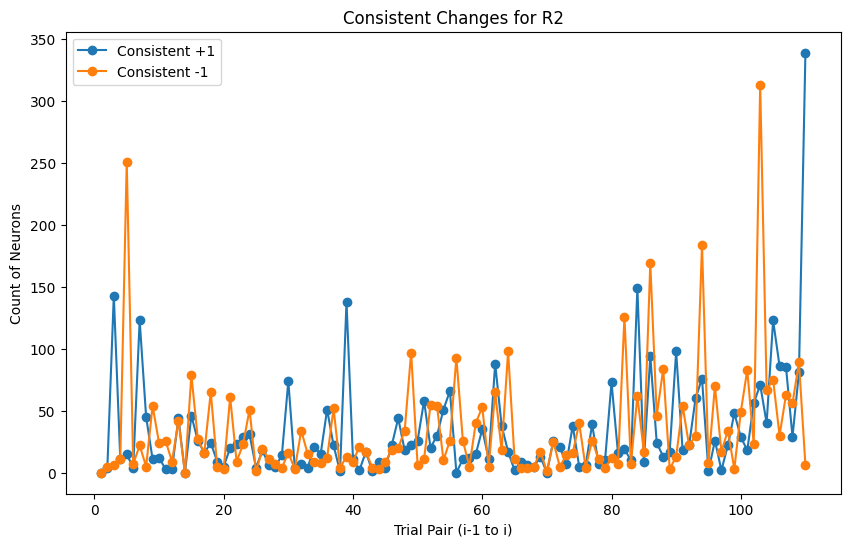

In [33]:
trial_pairs_cs2 = np.arange(1, changes_cs2.shape[0])
trial_pairs_r2 = np.arange(1, changes_r2.shape[0])


# Visualize the counts for CS condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_cs2, pos_cs2, marker='o', label='Consistent +1')
#plt.plot(trial_pairs_cs2, zero_cs2, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_cs2, neg_cs2, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for CS2')
plt.legend()
plt.show()

# Visualize the counts for R condition.
plt.figure(figsize=(10, 6))
plt.plot(trial_pairs_r2, pos_r2, marker='o', label='Consistent +1')
#plt.plot(trial_pairs_r2, zero_r2, marker='o', label = "Consistent 0")
plt.plot(trial_pairs_r2, neg_r2, marker='o', label='Consistent -1')
plt.xlabel('Trial Pair (i-1 to i)')
plt.ylabel('Count of Neurons')
plt.title('Consistent Changes for R2')
plt.legend()
plt.show()